In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import urllib
from tqdm.notebook import tqdm
from pathlib import Path
from multiprocessing import Pool
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

import timm
import fastai.text.all as fastai
from fastai.callback.schedule import Learner

# from torch.utils.tensorboard import SummaryWriter
from tensorboardX import SummaryWriter
# %load_ext tensorboard

import spacy
import re
import nltk
import torchtext

from IPython.display import Audio
import pydub
from scipy import signal
import librosa
import torchaudio

seed = 42
np.random.seed(seed)
torch.manual_seed(seed + 1)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed + 2)

In [2]:
def get_device():
    if torch.cuda.is_available():
        device = 'cuda'
    elif hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
        device = 'mps'
    else:
        device = 'cpu'
    return device

device = get_device()

print(f'device: {device}')

device: cuda


In [3]:
model_path = Path.cwd() / 'models'

In [72]:
def get_optimizer(model, optimizer='sgd', lr=0.001, weight_decay=0, momentum=0, betas=(0.9, 0.999), eps=1e-8):
    if optimizer == 'sgd':
        opt = torch.optim.SGD(
            model.parameters(),
            lr=lr, 
            weight_decay=weight_decay, 
            momentum=momentum
        )
    if optimizer == 'adam':
        opt = torch.optim.Adam(
            model.parameters(),
            lr=lr,
            weight_decay=weight_decay,
            betas=betas,
            eps=eps
        )
    if optimizer == 'radam':
        opt = torch.optim.RAdam(
            model.parameters(),
            lr=lr,
            weight_decay=weight_decay,
            betas=betas,
            eps=eps
        )
    return opt

def train_classifier(train_data, model, opt, loss_fn, test_data=None, num_epochs=10, plot_loss=True, batch_size=32,
                     tensorboard=False, print_stats=True, show_batches_bar=False, shuffle=True, scheduler=None,
                     print_every=1, n_grad_accums=1, use_multi_gpus=False, collate_fn=None, pin_memory=False):
    from torch.utils.data import DataLoader
    if tensorboard:
        writer = SummaryWriter()
    losses = []
    num_workers = 1 if device == 'cuda' else 0
    pin_memory = True if (pin_memory and device == 'cuda') else False
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=shuffle, collate_fn=collate_fn, 
                              num_workers=num_workers, pin_memory=pin_memory)
    if test_data is not None:
        test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, collate_fn=collate_fn, 
                                 num_workers=num_workers, pin_memory=pin_memory)
    if use_multi_gpus:
        orig_model = model
        model = nn.DataParallel(model)
    for epoch in tqdm(range(num_epochs)):
        model = model.train()
        total_losses = []
        total_correct = []
        iterator = tqdm(train_loader, leave=False) if show_batches_bar else train_loader
        for i, (X, y) in enumerate(iterator):
            X = X.to(device)
            y = y.to(device)
            yhat = model(X)
            loss = loss_fn(yhat, y).mean() # mean is for multi-gpu losses, avg them together
            loss /= n_grad_accums # rescale loss for grad accumulation
            loss.backward()
            if i % n_grad_accums == 0: # only step when every n_grad_accums grad updates
                opt.step()
                opt.zero_grad()
            total_losses.append(float(loss))
            total_correct.append(float((yhat.argmax(dim=1) == y).sum().cpu()))
        train_loss = np.mean(total_losses)
        train_acc = sum(total_correct) / len(train_data)
        losses.append(train_loss)
        
        if test_data is not None:
            model = model.eval()
            opt.zero_grad()
            total_losses = []
            total_correct = []
            iterator = tqdm(test_loader, leave=False) if show_batches_bar else test_loader
            for X, y in iterator:
                X = X.to(device)
                y = y.to(device)
                yhat = model(X)
                loss = loss_fn(yhat, y).mean()
                total_losses.append(float(loss))
                total_correct.append(float((yhat.argmax(dim=1) == y).sum().cpu()))
            test_loss = np.mean(total_losses)
            test_acc = sum(total_correct) / len(test_data)
        else:
            test_loss = -999
            test_acc = -999
            
        if scheduler is not None:
            scheduler.step()

        if tensorboard:
            writer.add_scalar("Training Loss", train_loss, epoch+1)
            writer.add_scalar("Training Accuracy", train_acc, epoch+1)
            writer.add_scalar("Test Loss", test_loss, epoch+1)
            writer.add_scalar("Test Accuracy", test_acc, epoch+1)
        if print_stats and epoch % print_every == 0:
            s1 = f'epoch: {epoch: <3}   ' 
            s2 = f'train loss: {round(train_loss, 5): <6}   train acc: {round(train_acc, 5): <6}   ' 
            s3 = f'test loss: {round(test_loss, 5): <6}   test acc: {round(test_acc, 5): <6}'
            print(s1 + s2 + s3)
    if plot_loss:
        plt.plot(range(len(losses)), losses)
        plt.title('Training Loss')
        plt.xlabel('epochs')
        plt.show()
    if tensorboard:
        writer.flush()
        writer.close()
    model = model if not use_multi_gpus else orig_model
    return model

def train_seq2seq(train_data, model, opt, loss_fn, model_type, test_data=None, num_epochs=10, plot_loss=True, 
                  batch_size=32, tensorboard=False, print_stats=True, show_batches_bar=False, shuffle=True, 
                  scheduler=None, print_every=1, n_grad_accums=1, use_multi_gpus=False, grad_clip=1, 
                  teacher_forcing=0.5, collate_fn=None, pin_memory=False):
    from torch.utils.data import DataLoader
    if tensorboard:
        writer = SummaryWriter()
    losses = []
    num_workers = 1 if device == 'cuda' else 0
    pin_memory = True if (pin_memory and device == 'cuda') else False
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=shuffle, collate_fn=collate_fn, 
                              num_workers=num_workers, pin_memory=pin_memory)
    if test_data is not None:
        test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, collate_fn=collate_fn, 
                                 num_workers=num_workers, pin_memory=pin_memory)
    if use_multi_gpus:
        orig_model = model
        model = nn.DataParallel(model)
       
    for epoch in tqdm(range(num_epochs)):
        model = model.train()
        total_losses = []
        iterator = tqdm(train_loader, leave=False) if show_batches_bar else train_loader
        # if not specified, use heavy teacher forcing early in training and decay it linearly to zero
        teacher_forcing = (1 - epoch / num_epochs) * teacher_forcing
        for i, (X, Y) in enumerate(iterator):
            X = X.to(device).long()
            Y = Y.to(device).long()
            bs, bptt = Y.shape[0], Y.shape[1]
            if model_type == 'seq2seq_rnn':
                Yhat = model(X, h=None, Y=Y, teacher_forcing=teacher_forcing)
            if model_type == 'seq2seq_transformer':
                Yhat = model(X, Y=Y)
            if model_type == 'lm_rnn':
                Yhat = model(X, h=None)
            if model_type == 'lm_transformer':
                Yhat = model(X)
            y = Y.reshape(bs * bptt,)
            yhat = Yhat.reshape(bs * bptt, -1)
            loss = loss_fn(yhat, y).mean() # mean is for multi-gpu losses, avg them together
            loss /= n_grad_accums # rescale loss for grad accumulation
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), grad_clip)
            if i % n_grad_accums == 0: # only step when every n_grad_accums grad updates
                opt.step()
                if scheduler is not None:
                    scheduler.step()
                opt.zero_grad()
            total_losses.append(float(loss))
            if tensorboard:
                iters = epoch * len(train_loader) + i
                writer.add_scalar("Training Loss", float(loss), iters)
        train_loss = np.mean(total_losses)
        losses.append(train_loss)
        
        if test_data is not None:
            model = model.eval()
            opt.zero_grad()
            total_losses = []
            iterator = tqdm(test_loader, leave=False) if show_batches_bar else test_loader
            for X, Y in iterator:
                X = X.to(device)
                Y = Y.to(device)
                bs, bptt = Y.shape[0], Y.shape[1]
                if model_type == 'rnn':
                    Yhat = model(X, h=None, Y=Y)
                if model_type == 'seq2seq_transformer':
                    Yhat = model(X, Y=Y)
                if model_type == 'lm_rnn':
                    Yhat = model(X, h=None)
                if model_type == 'lm_transformer':
                    Yhat = model(X)
                y = Y.reshape(bs * bptt,)
                yhat = Yhat.reshape(bs * bptt, -1)
                loss = loss_fn(yhat, y).mean()
                total_losses.append(float(loss))
            test_loss = np.mean(total_losses)
        else:
            test_loss = -999
            
        if tensorboard:
            writer.add_scalar("Test Loss", test_loss, epoch)
        if print_stats and (epoch % print_every == 0) or (epoch == num_epochs - 1):
            s1 = f'epoch: {epoch: <3}   ' 
            s2 = f'train loss: {round(train_loss, 5): <6}   test loss: {round(test_loss, 5): <6}' 
            print(s1 + s2)
    if plot_loss:
        plt.plot(range(len(losses)), losses)
        plt.title('Training Loss')
        plt.xlabel('epochs')
        plt.show()
    if tensorboard:
        writer.flush()
        writer.close()
    model = model if not use_multi_gpus else orig_model
    return model

def predict(test_data, model, batch_size=32, collate_fn=None):
    from torch.utils.data import DataLoader
    test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, collate_fn=collate_fn, pin_memory=False)
    model = model.eval()
    preds = []
    for X, y in tqdm(test_loader):
        X = X.to(device)
        y = y.to(device)
        yhat = model(X).detach()
        preds.append(yhat.argmax(dim=-1).cpu())
    preds = torch.cat(preds, dim=0).flatten()
    return preds

def predict_seq2seq(data, model, model_type, batch_size=32, collate_fn=None):
    # returns sequence flattened predictions *and* sequence flattened targets (y, yhat)
    # y.shape = yhat.shape = (bs * bptt,)
    from torch.utils.data import DataLoader
    data_loader = DataLoader(data, batch_size=batch_size, shuffle=False, collate_fn=collate_fn, pin_memory=False) 
    model = model.eval()
    yhat = []
    y = []
    for X, Y in tqdm(data_loader):
        X = X.to(device)
        Y = Y.to(device)
        bs, bptt = Y.shape
        if model_type == 'seq2seq_rnn':
            Yhat = model(X, h=None, Y=Y).detach()
        if model_type == 'seq2seq_transformer':
            Yhat = model(X, Y=Y).detach()
        if model_type == 'lm_rnn':
            Yhat = model(X, h=None).detach()
        if model_type == 'lm_transformer':
            Yhat = model(X).detach()
        yhat.append(Yhat.reshape(bs * bptt, -1).argmax(dim=-1).cpu())
        y.append(Y.reshape(bs * bptt, -1).cpu())
    yhat = torch.cat(yhat, dim=0).flatten()
    y = torch.cat(y, dim=0).flatten()
    return yhat, y

class Dataset:
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]
    
def garbage_collect():
    import gc
    return gc.collect()

# Audio

- Speech recognition takes in an audio waveform of speech and outputs its text transcription. Typically this is a seq2seq model mapping a sequence of audio samples to a sequence of text.
- Typically, audio is encoded as a spectrogram before passing it through the model. This allows the model to more efficiently learn from having both the temporal signal and the frequencies across time.
- Classically, audio used to be converted into "phonemes", which were feature engineered units of sound. Since end to end deep learning, phonemes are no longer necessary.
- The sequence length of an audio signal is its sampling frequency (in Hertz) times its length (in seconds). A 10 sec audio clip sampled at 100 Hz would have a sequence length of 1000. Typically, audio sequence lengths are much larger than the text sequence lengths.
- To get around the sequence length issue, one might use the CTC method. Suppose one wanted to transcribe an audio clip to `the quick brown fox`. Then the model might output something much longer like:
```
tttt_h_eeeee___ qqqq__uuuu_iiiii____ccc_kkkk bbb___rrrrrr__oooo__wwwww___nnnnnnn fffff_ooooo____xxxxxx
```
that is the length of the audio sequence length. Then in post processing, one collapses all characters not separated by a `_` to get the output text.
- A simplified example of speech recognition is trigger word (or wake word) detection. In this case, the model just "listens" for a certain phrase and outputs when that phrase occurs. This is used, e.g., in audio devices like Alexa or Siri to "wake" them to listen for speech via "alexa" or "hey Siri".
- Trigger word models are essentially binary sequence models, where each input sample maps to a `0` or `1`, with `1` being "trigger word detected at this sample". To avoid class imbalance, one often chooses to output `1` for some fixed number of steps after trigger word detection.

## Audio Examples

### Pydub

In [6]:
filename = librosa.example('nutcracker')
audio = pydub.AudioSegment.from_ogg(filename)

In [7]:
audio

In [8]:
waveform = np.array(audio.get_array_of_samples())
waveform.shape, waveform

((2643328,),
 array([  4878,  11452, -15564, ...,  16574,   8762,   -527], dtype=int32))

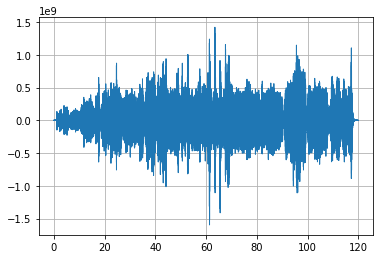

In [9]:
def plot_waveform(waveform, sample_rate, title='', xlabel='', ylabel=''):
    n_frames = len(waveform)
    time_axis = torch.arange(0, n_frames) / sample_rate
    fig, ax = plt.subplots(1, 1)
    ax.plot(time_axis, waveform, linewidth=1)
    ax.grid(True)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.show()
    
plot_waveform(waveform, audio.frame_rate)

In [10]:
freqs, times, spectrogram = signal.spectrogram(waveform, fs=2, nfft=256, return_onesided=True, noverlap=128)
freqs.shape, times.shape, spectrogram.shape

((129,), (20650,), (129, 20650))

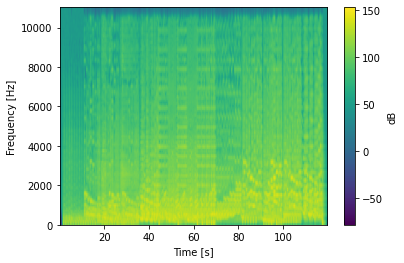

In [11]:
def plot_spectrogram(waveform=None, spectrogram=None, sample_rate=1, title='', xlabel='', ylabel='', 
                     clabel='', **kwargs):
    fig, ax = plt.subplots(1, 1)
    if waveform is not None:
        spectrogram, freqs, times, im = ax.specgram(waveform, scale='dB', **kwargs)
    elif spectrogram is not None:
        im = ax.imshow(librosa.power_to_db(spectrogram), origin='lower', aspect='auto')
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label(clabel, loc='center')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    plt.show()

plot_spectrogram(waveform, Fs=audio.frame_rate, clabel='dB', xlabel='Time [s]', ylabel='Frequency [Hz]')

In [12]:
# adjust sound intensity
target_dBFS = 0
audio.apply_gain(target_dBFS - audio.dBFS)

### Librosa

In [13]:
filename = librosa.example('brahms')

In [14]:
waveform, sample_rate = librosa.load(filename)
waveform.shape, sample_rate

((1010880,), 22050)

In [15]:
Audio(data=waveform, rate=sample_rate)

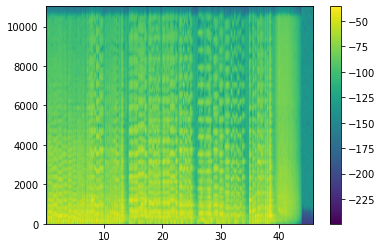

In [16]:
plot_spectrogram(waveform, Fs=sample_rate)

In [17]:
tempo, beat_frames = librosa.beat.beat_track(y=waveform, sr=sample_rate)
beat_times = librosa.frames_to_time(beat_frames, sr=sample_rate)
print(f'Estimated tempo: {tempo} beats per minute')
beat_frames.shape, beat_times.shape

Estimated tempo: 151.99908088235293 beats per minute


((102,), (102,))

### TorchAudio

In [18]:
filename = librosa.example('brahms')
metadata = torchaudio.info(filename)
print(metadata)

AudioMetaData(sample_rate=22050, num_frames=1010880, num_channels=1, bits_per_sample=0, encoding=VORBIS)


In [19]:
waveform, sample_rate = torchaudio.load(filename)
sample_rate, waveform.shape

(22050, torch.Size([1, 1010880]))

In [20]:
def print_stats(waveform, sample_rate=None, src=None):
    if src:
        print("-" * 10)
        print("Source:", src)
        print("-" * 10)
    if sample_rate:
        print("Sample Rate:", sample_rate)
        print("Shape:", tuple(waveform.shape))
        print("Dtype:", waveform.dtype)
        print(f" - Max:     {waveform.max().item():6.3f}")
        print(f" - Min:     {waveform.min().item():6.3f}")
        print(f" - Mean:    {waveform.mean().item():6.3f}")
        print(f" - Std Dev: {waveform.std().item():6.3f}")
        print()
    
print_stats(waveform, sample_rate=sample_rate)

Sample Rate: 22050
Shape: (1, 1010880)
Dtype: torch.float32
 - Max:      0.783
 - Min:     -0.646
 - Mean:    -0.000
 - Std Dev:  0.072



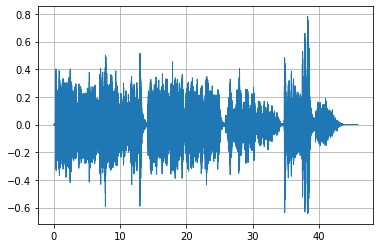

In [21]:
plot_waveform(waveform.cpu().numpy().flatten(), sample_rate)

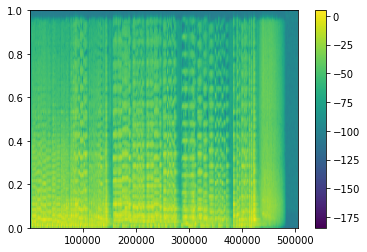

In [22]:
plot_spectrogram(waveform.numpy().flatten())

In [23]:
resample_rate = sample_rate // 3
resampled_waveform = torchaudio.functional.resample(waveform, sample_rate, resample_rate)
waveform.shape, resampled_waveform.shape

(torch.Size([1, 1010880]), torch.Size([1, 336960]))

In [24]:
Audio(data=waveform.numpy(), rate=sample_rate)

In [25]:
Audio(data=resampled_waveform.numpy(), rate=resample_rate)

In [26]:
transform = torchaudio.transforms.Spectrogram(n_fft=1024, win_length=None, hop_length=512, center=True, 
                                              pad_mode="reflect", power=2.)
spectrogram = transform(waveform)

print_stats(spectrogram, sample_rate=sample_rate)

Sample Rate: 22050
Shape: (1, 513, 1975)
Dtype: torch.float32
 - Max:     4316.615
 - Min:      0.000
 - Mean:     2.010
 - Std Dev: 25.151



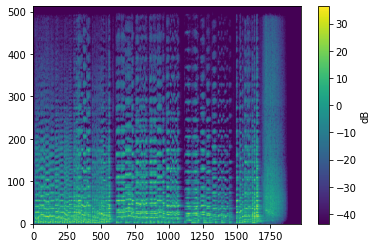

In [27]:
plot_spectrogram(spectrogram=spectrogram[0], clabel='dB')

torch.Size([1, 1010688])

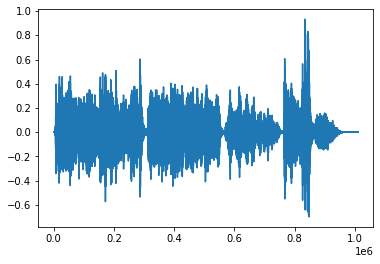

In [28]:
griffin_lim = torchaudio.transforms.GriffinLim(n_fft=1024, win_length=None, hop_length=512)
waveform_reconstructed = griffin_lim(spectrogram)
plt.plot(waveform_reconstructed.numpy().flatten())
waveform_reconstructed.shape

In [29]:
Audio(data=waveform_reconstructed.numpy().flatten(), rate=sample_rate)

In [30]:
mel_filters = torchaudio.functional.melscale_fbanks(n_freqs=1975, n_mels=512, f_min=0., f_max=sample_rate/2, 
                                                    sample_rate=sample_rate, norm='slaney')
mel_filters.shape

torch.Size([1975, 512])

In [31]:
transform = torchaudio.transforms.MelSpectrogram(sample_rate=sample_rate, n_fft=1024, win_length=None,
                                                 hop_length=None, center=True, pad_mode="reflect", power=2., 
                                                 norm='slaney', onesided=True, n_mels=128, mel_scale="htk")

mel_spectrogram = transform(waveform)
mel_spectrogram.shape

torch.Size([1, 128, 1975])

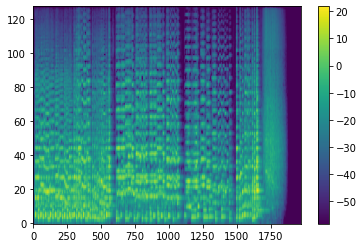

In [32]:
plot_spectrogram(spectrogram=mel_spectrogram.numpy()[0])

In [33]:
transform = torchaudio.transforms.MFCC(sample_rate=sample_rate, n_mfcc=128, melkwargs={
      'n_fft': 1024,
      'n_mels': 128,
      'hop_length': None,
      'mel_scale': 'htk',
    }
)

mfcc_spectrogram = transform(waveform)
mfcc_spectrogram.shape

torch.Size([1, 128, 1975])

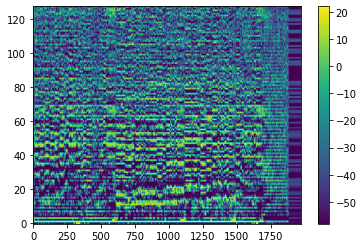

In [34]:
plot_spectrogram(spectrogram=mfcc_spectrogram.numpy()[0])

## Data Processing

In [105]:
data_path = Path.home() / 'data'
train_data = torchaudio.datasets.SPEECHCOMMANDS(data_path, download=True, subset='training')
test_data = torchaudio.datasets.SPEECHCOMMANDS(data_path, download=True, subset='testing')
val_data = torchaudio.datasets.SPEECHCOMMANDS(data_path, download=True, subset='validation')

In [106]:
waveform, sample_rate, label, speaker_id, utterance_number = train_data[100]
waveform.shape, sample_rate, label, speaker_id, utterance_number

(torch.Size([1, 16000]), 16000, 'backward', '14c7b073', 4)

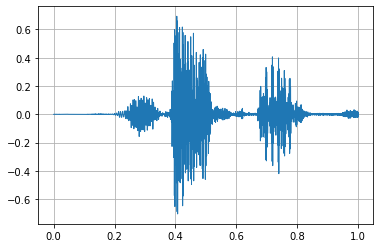

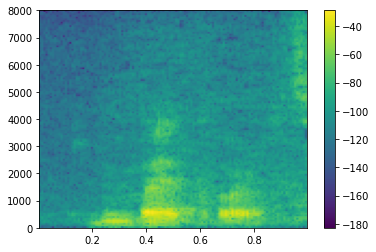

In [107]:
plot_waveform(waveform.cpu().numpy().flatten(), sample_rate)
plot_spectrogram(waveform.cpu().numpy().flatten(), Fs=sample_rate)
Audio(data=waveform.cpu().numpy().flatten(), rate=sample_rate)

In [108]:
labels = sorted(list(set([datum[2] for datum in test_data])))
print(labels)

['backward', 'bed', 'bird', 'cat', 'dog', 'down', 'eight', 'five', 'follow', 'forward', 'four', 'go', 'happy', 'house', 'learn', 'left', 'marvin', 'nine', 'no', 'off', 'on', 'one', 'right', 'seven', 'sheila', 'six', 'stop', 'three', 'tree', 'two', 'up', 'visual', 'wow', 'yes', 'zero']


In [109]:
new_sample_rate = 8000
transform = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=new_sample_rate)
transformed = transform(waveform)
Audio(data=waveform.cpu().numpy().flatten(), rate=sample_rate)

In [110]:
def label_to_index(labels, word):
    return torch.tensor(labels.index(word))

def index_to_label(labels, index):
    return labels[index]

def pad_sequence(batch):
    # Make all tensor in a batch the same length by padding with zeros
    batch = [item.t() for item in batch]
    batch = nn.utils.rnn.pad_sequence(batch, batch_first=True, padding_value=0.)
    return batch.permute(0, 2, 1)

def collate_fn(batch, labels=labels, sample_rate=sample_rate, new_sample_rate=new_sample_rate):
    X, y = [], []
    for waveform, _, label, *_ in batch:
        X += [waveform]
        y += [label_to_index(labels, label)]
    transform = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=new_sample_rate)
    X = pad_sequence(X)
    X = transform(X)
    y = torch.stack(y)
    return X, y

In [111]:
batch_size = 256
num_workers = 1 if device == 'cuda' else 0
pin_memory = True if device == 'cuda' else False

train_loader = DataLoader(
    train_data,
    batch_size=batch_size,
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=num_workers,
    pin_memory=pin_memory,
)
test_loader = DataLoader(
    test_data,
    batch_size=batch_size,
    shuffle=False,
    drop_last=False,
    collate_fn=collate_fn,
    num_workers=num_workers,
    pin_memory=pin_memory,
)

In [112]:
X, y = next(iter(train_loader))
X.shape, y.shape

(torch.Size([256, 1, 8000]), torch.Size([256]))

## Training: Speech Classification

In [113]:
class M5(nn.Module):
    def __init__(self, n_inputs=1, n_outputs=35, n_channels=32, stride=16):
        super().__init__()
        self.conv1 = nn.Conv1d(n_inputs, n_channels, kernel_size=80, stride=stride)
        self.bn1 = nn.BatchNorm1d(n_channels)
        self.pool1 = nn.MaxPool1d(4)
        self.conv2 = nn.Conv1d(n_channels, n_channels, kernel_size=3)
        self.bn2 = nn.BatchNorm1d(n_channels)
        self.pool2 = nn.MaxPool1d(4)
        self.conv3 = nn.Conv1d(n_channels, 2 * n_channels, kernel_size=3)
        self.bn3 = nn.BatchNorm1d(2 * n_channels)
        self.pool3 = nn.MaxPool1d(4)
        self.conv4 = nn.Conv1d(2 * n_channels, 2 * n_channels, kernel_size=3)
        self.bn4 = nn.BatchNorm1d(2 * n_channels)
        self.pool4 = nn.MaxPool1d(4)
        self.fc1 = nn.Linear(2 * n_channels, n_outputs)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(self.bn1(x))
        x = self.pool1(x)
        x = self.conv2(x)
        x = F.relu(self.bn2(x))
        x = self.pool2(x)
        x = self.conv3(x)
        x = F.relu(self.bn3(x))
        x = self.pool3(x)
        x = self.conv4(x)
        x = F.relu(self.bn4(x))
        x = self.pool4(x)
        x = F.avg_pool1d(x, x.shape[-1])
        x = x.permute(0, 2, 1)
        x = self.fc1(x)
        x = x.squeeze(dim=1)
        return x

  0%|          | 0/30 [00:00<?, ?it/s]

epoch: 0     train loss: 1.7798   train acc: 0.4938   test loss: 1.2193   test acc: 0.6356
epoch: 1     train loss: 0.9497   train acc: 0.7229   test loss: 1.4656   test acc: 0.5826
epoch: 2     train loss: 0.7756   train acc: 0.7738   test loss: 0.8124   test acc: 0.761 
epoch: 3     train loss: 0.6828   train acc: 0.7989   test loss: 0.7702   test acc: 0.7742
epoch: 4     train loss: 0.6365   train acc: 0.8113   test loss: 0.7318   test acc: 0.7881
epoch: 5     train loss: 0.5966   train acc: 0.823    test loss: 0.9328   test acc: 0.7225
epoch: 6     train loss: 0.5684   train acc: 0.8307   test loss: 0.7046   test acc: 0.7975
epoch: 7     train loss: 0.5432   train acc: 0.8377   test loss: 0.7551   test acc: 0.7821
epoch: 8     train loss: 0.5289   train acc: 0.8432   test loss: 0.7604   test acc: 0.7799
epoch: 9     train loss: 0.5138   train acc: 0.8458   test loss: 0.6172   test acc: 0.8226
epoch: 10    train loss: 0.4127   train acc: 0.8788   test loss: 0.5291   test acc: 0.8481

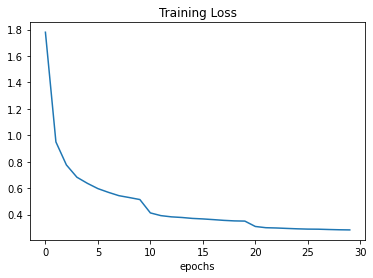

M5(
  (conv1): Conv1d(1, 32, kernel_size=(80,), stride=(16,))
  (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv1d(32, 32, kernel_size=(3,), stride=(1,))
  (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv1d(32, 64, kernel_size=(3,), stride=(1,))
  (bn3): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool3): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv4): Conv1d(64, 64, kernel_size=(3,), stride=(1,))
  (bn4): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool4): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=64, out_features=35, bias=True)
)

In [70]:
model = M5(n_inputs=1, n_outputs=len(labels))
model = model.to(device)
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.005, weight_decay=0.0001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.3)
train_classifier(train_data, model, optimizer, loss_fn, test_data=test_data, batch_size=256, collate_fn=collate_fn,
                 num_epochs=30, scheduler=scheduler, show_batches_bar=False)

In [114]:
# torch.save(model.state_dict(), model_path / 'checkpoint.pth')
model = M5(n_inputs=1, n_outputs=len(labels))
model.load_state_dict(torch.load(model_path / 'checkpoint.pth', map_location=torch.device(device)))

<All keys matched successfully>

In [270]:
def predict(waveform, model, labels=labels, orig_freq=sample_rate, new_freq=new_sample_rate):
    model = model.eval().to(device)
    waveform = waveform.to(device)
    transform = torchaudio.transforms.Resample(orig_freq=orig_freq, new_freq=new_freq)
    transform = transform.to(device)
    waveform = transform(waveform)
    yhat = model(waveform.unsqueeze(0))
    pred = yhat.argmax(dim=-1).squeeze().cpu()
    label = index_to_label(labels, pred)
    return label

In [116]:
idx = 1001

waveform, sample_rate, ground_truth, _, _ = test_data[idx]
waveform = waveform.to(device)
label = predict(waveform, model)

print(f'Ground Truth: {ground_truth}')
print(f'Predicted: {label}')

Audio(data=transform(waveform).cpu().numpy(), rate=sample_rate)

Ground Truth: tree
Predicted: three


In [238]:
def recording_to_tensor(recorder, filename=model_path / 'recording.wav'):
    from io import BytesIO
    pydub.AudioSegment.from_file(BytesIO(recorder.audio.value)).export(filename, format='wav')
    waveform, sample_rate = torchaudio.load(filename)
    return waveform, sample_rate

In [272]:
from ipywebrtc import AudioRecorder, CameraStream

camera = CameraStream(constraints={'audio': True,'video':False})
recorder = AudioRecorder(stream=camera)
display(recorder)

AudioRecorder(audio=Audio(value=b'', format='webm'), stream=CameraStream(constraints={'audio': True, 'video': …

In [273]:
waveform, sample_rate = recording_to_tensor(recorder)
waveform.shape, sample_rate

(torch.Size([1, 74880]), 48000)

In [274]:
predict(waveform, model, orig_freq=sample_rate, new_freq=new_sample_rate)

'three'

# Transformers

- Transformer networks are the newest and most powerful neural network architectures for sequence modeling. The tradeoff is that they are more complex to understand. Roughly speaking, in terms of *both* power and complexity, we have
$$\text{RNNs} < \text{GRUs} < \text{LSTMs} < \text{Transformers}.$$
- The main power of the transformer is that (similar to CNNs and dense layers) it allows you to process sequences in *parallel*, unlike RNNs which are processed *sequentially*. This allows a massive training speedup as well as the use of much deeper sequence models.
- Transformers are technically *set prediction* models, not *sequence prediction* models. That is, they learn which things belong together, but not necessarily the order in which they belong (at least without hacks like positional embeddings and encodings).
- Transformers are built on the idea of attention. Its two main concepts are *self attention* and *multi-headed attention*.
- **Self Attention:** The fundamental sequence layer of a transformer that makes them work.
    - In essense, a self attention layer is a layer whose outputs are scaled weighted averages of the inputs.
    - For a given layer with inputs $x_1,\cdots,x_T$ and outputs $y_1,\cdots,y_T$ of the same length, a self attention layer learns an attention matrix $A$ between the inputs and outputs. 
    - **Idea:** Think of $A_{ij}$ as the amount of attention that $y_i$ pays to $x_j$ (scaled between 0 and 1), and each output $y_i$ as a $A_{ij}$ weighted combination of the $x_j$.
    - We don't learn the attention weights $A_{ij}$ directly, but instead by using intermediate outputs $q_j$ and $k_j$, called *queries* and *keys*. The queries and keys are linearly related to the inputs via (learned, square, shared) weight matrices $W^Q, W^K$: $$q_j \equiv W^Q x_j,$$ $$k_j \equiv W^K x_j.$$ 
    - The attention weights are then given by dotting the keys and queries and feeding them through a softmax to ensure the values are between 0 to one, and the rows (and columns) sum to 1. To help prevent gradient vanishing, it's also common to also scale the dot products by the sequence length $T$. This finally gives $A_{ij}$ as $$A_{ij} \equiv \text{softmax}\bigg(\frac{q_i^\top k_j}{\sqrt{T}}\bigg).$$ Note $A$ is *not* generally symmetric!
    - To get $y_i$, instead of taking the direct linear combination over each $x_j$, we calculate another set of intermediate output $v_j$ called the *values* using yet another (learned, square, shared) weight matrix $W^V$, which can be thought of as an "embedding" of each $x_j$ into a feature space $v_j$: $$v_j \equiv W^V x_j.$$ Using these values, we then *define* the outputs by
    $$y_i \equiv \sum_j A_{ij} v_j.$$
    - **Terminology:** Where do the terms key, query, and value come from? In databases, one has a notion of "queries" as well as "key-value pairs". We can (loosely) think of the query $q_i$ as a "question" we get to ask about the input $x_i$. The "key" $k_j$ can be thought of as the information contained in input $x_j$. The dot product $q_i^\top k_j$ then attempts to answer the question: How good is $x_j$ at helping to answer our question $q_i$ about $x_i$? Answering this question about $i$ for each $j$, weighted against the "values" $v_i$ then gives us information about the "best" answer to the question, i.e. $y_i$.
    - **Note:** Since the attention matrix must be calculated for all input-output pairs, self attention runs in *quadratic time and memory* in the sequence length $T$, i.e. self attention is $O(T^2)$.
<img src="https://peterbloem.nl/files/transformers/key-query-value.svg" alt="Self Attention" width="350"/>

In [16]:
class SelfAttention(nn.Module):
    # self attention with no multiheads
    def __init__(self, emb_size):
        super().__init__()
        self.keys = nn.Linear(emb_size, emb_size, bias=False)
        self.queries = nn.Linear(emb_size, emb_size, bias=False)
        self.values = nn.Linear(emb_size, emb_size, bias=False)

    def forward(self, x):
        # x.shape = (batch_size, seq_len, emb_size)
        seq_len = x.shape[1]
        keys = self.keys(x) / (seq_len) ** (1 / 4)
        queries = self.queries(x) / (seq_len) ** (1 / 4)
        e = torch.bmm(keys, queries.transpose(1, 2))
        attention = F.softmax(e, dim=2)
        values = self.values(x)
        y = torch.bmm(attention, values)
        return y
    
x = torch.rand(5, 10, 100)

model = SelfAttention(100)
yhat = model(x)

x.shape, yhat.shape

(torch.Size([5, 10, 100]), torch.Size([5, 10, 100]))

- **Multiheaded Attention:** A way to allow transformers to learn sequential relationships instead of just set relationships, and hedge its bets by learning more contextual relationships between sequence elements.
    - **Idea:** Rather than calculate self attention once per layer, calculate self attention $n_H$ times to get $n_H$ different sets of outputs, called "heads".
    - This is in some sense similar to anchor boxes in object detection, in that it allows a transformer to keep multiple copies of the outputs in a transformer block, essentially hedging its bets on which one is best.
    - Instead of self attention sending inputs $x_1, \cdots, x_T$ to outputs $y_1, \cdots, y_T$, it instead sends $h$ "attention heads" of these through self attention: 
    $$\big(x_1^{(1)}, \cdots, x_T^{(1)}, \cdots, x_1^{(h)}, \cdots, x_T^{(h)}\big) \rightarrow \big(y_1^{(1)}, \cdots, y_T^{(1)}, \cdots, y_1^{(h)}, \cdots, y_T^{(h)}\big).$$
    - Each head $h$ in a self attention layer will have its own weight matrices $W^{Q,(h)}, W^{K,(h)}, W^{V,(h)}$.
    - There are different conventions for how to go from the original length $T$ sequences to the length $hT$ multiheaded sequences in the self attention layer.
    - Informally speaking, suppose a self attention layer has 5 heads, $h=5$. Then one could "imagine" each head learning to ask a specific type of question about the inputs, like "who", "what", "where", "when", and "why".
    - Since each head in a layer is independent of the others, each head can be done together in parallel instead of in a loop.
    
- **Masking:** By default, self attention is able to operate acausally because it takes in the entire sequence at once and processes it in parallel. In many time series applications one needs to do inference causally, i.e. information at future times can't propagate to past times. To do this with self attention we can *mask* the future time vectors during training, so the network doesn't learn to use the future to predict the past.
    - For autoregressive models, i.e. tasks that predict the next token in a sequence (where causality in the outputs is important), one can simulate this during training by masking the future inputs.
    - The way masking is done for transformers is by masking the attention weights with a lower triangular matrix of ones, which zeros out the upper triangle attention weights that affect future values.
    - In implementations, this is *really* done by setting the zeroed weights in the attention matrix directly to be $-\infty$.

In [6]:
class MultiheadAttention(nn.Module):
    def __init__(self, emb_size, num_heads, mask=False):
        super().__init__()
        self.keys = nn.Linear(emb_size, emb_size * num_heads, bias=False)
        self.queries = nn.Linear(emb_size, emb_size * num_heads, bias=False)
        self.values = nn.Linear(emb_size, emb_size * num_heads, bias=False)
        self.collapse = nn.Linear(emb_size * num_heads, emb_size, bias=True)
        self.num_heads = num_heads
        self.mask = mask
        
    def forward(self, x):
        # x.shape = y.shape = (batch_size, seq_len, emb_size)
        batch_size, seq_len, emb_size = x.shape
        
        keys = self.keys(x).transpose(1, 2).reshape(batch_size * self.num_heads, seq_len, emb_size)
        queries = self.queries(x).transpose(1, 2).reshape(batch_size * self.num_heads, seq_len, emb_size)
        values = self.values(x).transpose(1, 2).reshape(batch_size * self.num_heads, seq_len, emb_size)
        
        e = torch.bmm(keys, queries.transpose(1, 2)) / (seq_len) ** (1/2)
        if self.mask:
            mask = torch.triu_indices(seq_len, seq_len, offset=1)
            e[:, mask[0], mask[1]] = -torch.inf
        attention = F.softmax(e, dim=2)
        y = torch.bmm(attention, values).reshape(batch_size, self.num_heads, seq_len, emb_size)
        y = y.transpose(1, 2).reshape(batch_size, seq_len, emb_size * self.num_heads)
        y = self.collapse(y)
        return y
    
x = torch.rand(5, 10, 100)

model = MultiheadAttention(100, 10, mask=True)
yhat = model(x)

x.shape, yhat.shape

(torch.Size([5, 10, 100]), torch.Size([5, 10, 100]))

- **Layer Normalization:** Similar to batch normalization, layer normalization is a way to keep the size of activations from becoming too big or too small, having a regularization effect and prevent gradient vanishing. 
    - Recall that batch norm works by *normalizing examples over a mini-batch* for each feature independently
    - Layer norm works by *normalizing all input features* together for each *single* training example. 
    - This makes them work better for sequential models like RNNs and transformers because calculations can be done over each time step separately. 
    - It also uses the same computations at test time, rather than having to estimate the means and variances from the training set like batch norm does.
    - A trend seems to be that batch norm is used more for CV tasks (CNNs), while layer norm is used more for NLP tasks (RNNS, transformers).
    
![](https://i.stack.imgur.com/E3104.png)

In [7]:
class LayerNorm(nn.Module):
    def __init__(self, input_features, eps=1e-6):
        super().__init__()
        self.alpha = nn.Parameter(torch.ones(input_features))
        self.beta = nn.Parameter(torch.zeros(input_features))
        self.eps = eps

    def forward(self, x):
        mu = x.mean(-1, keepdim=True)
        sigma = x.std(-1, keepdim=True)
        return self.alpha * (x - mu) / (sigma + self.eps) + self.beta

- **Transformer Blocks:** Transformers are generally grouped into sets of transformer blocks, each composed of some sequence of self-attention, layer norm, and linear layers. See figure below for an example structure structure.
    - Residual connections are typically used between each layer in a transformer block to allow it to pass through input information as well as new learned feature information.
    - Self attention layers are the only layers in a transformer block that do sequential learning. All other blocks treat the inputs independently of each other.
<img src="https://peterbloem.nl/files/transformers/transformer-block.svg" alt="Transformer" width="550"/>

In [8]:
class TransformerBlock(nn.Module):
    def __init__(self, emb_size, num_heads, scale=4, mask=False):
        super().__init__()
        self.multihead = MultiheadAttention(emb_size, num_heads, mask=mask)
        self.norm1 = nn.LayerNorm(emb_size)
        self.fc = nn.Sequential(
            nn.Linear(emb_size, scale * emb_size),
            nn.ReLU(),
            nn.Linear(scale * emb_size, emb_size)
        )
        self.norm2 = nn.LayerNorm(emb_size)

    def forward(self, x):
        # x.shape = (batch_size, seq_len, emb_size)
        r = x
        x = self.multihead(x)
        x += r
        x = self.norm1(x)
        r = x
        x = self.fc(x)
        x += r
        x = self.norm2(x)
        return x
    
x = torch.rand(5, 10, 100)

model = TransformerBlock(100, 8, scale=4, mask=True)
yhat = model(x)

x.shape, yhat.shape

(torch.Size([5, 10, 100]), torch.Size([5, 10, 100]))

- **Positional Encodings:** By default, self attention is a set prediction layer, not a sequence prediction layer per se. To allow transformers to also learn positional relationships, it's common to use positional encodings.
    - **Idea:** Given a sequence $(x_1,\cdots,x_T)$, rather than just use each $x_t$ as inputs, we'll also separately use the positions $t$ by encoding them in the same feature space. 
    - Letting $p_t$ be that positional encoding, we then feed the the sequential sums $(x_1+p_1,\cdots,x_T+p_T)$ into the transformer. This in a sense colors each input $x_t$ with its position information by slightly perturbing its vector position by $p_t$.
    - Positional encoding is done for each transformer layer so that the positional information keeps getting passed along in the network.
    - The positional encodings are defined using some (usually predefined) mapping from $F:t \mapsto p_t \in \mathbb{R}^d$, where $d$ is the dimension of each $x_t$. One can try to learn such a function $F$ using embeddings, but this is less common.
    - One common example of such a mapping function $F$ for each $j = 1,\cdots,d$ is the trig encoding $$ 
    (p_t)_j = F_j(t) =
       \begin{cases} 
          \cos\big(tN^{-2j/d} \big), & j= \text{ even} \\
          \sin\big(tN^{-2j/d} \big), & j= \text{ odd},
       \end{cases}
    $$ where $N$ is some large number, e.g. $N=10,000$. These functions, parametrized by $j$, essentially behave like inverse harmonics, with each successive pair 90 degrees out of phase, but double the period of the previous pair. This ensures each position gets mapped to a unique value in a systematic way. Each $t$ just samples these curves uniformly.
    - For input sequences, positional encodings are applied *after* passing the inputs through an embedding layer.

In [9]:
d = 4
N = 2
T = 10

x = np.linspace(0, T, 100)
times = np.arange(T)
js = np.arange(d)
f = lambda t, j: np.cos(t*N**(-2*j/d)) * (j % 2 == 0) + np.sin(t*N**(-2*(j-1)/d)) * (j % 2 != 0)

In [10]:
t = 2
p_t = f(t, js)
p_t

array([-0.41614684,  0.90929743,  0.54030231,  0.84147098])

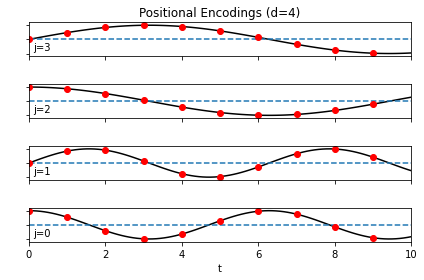

In [11]:
for j in range(d):    
    plt.subplot(d, 1, d - j)
    plt.plot(x, f(x, j), color='black')
    plt.hlines(0, 0, T, linestyle='--')
    for t in times:
        plt.plot(t, f(t, j), marker='o', color='red')
    plt.xticks(color='w')
    plt.yticks(color='w')
    plt.xlim(0, T)
    plt.ylim(-1.2, 1.2)
    plt.annotate(f'j={j}', (0.1, -0.8))
    if j == 0:
        plt.xlabel('t')
        plt.xticks(color='black')
    if j == d - 1:
        plt.title(f'Positional Encodings (d={d})')
plt.tight_layout()
plt.show()

In [11]:
class PositionalEncoding(nn.Module):
    def __init__(self, emb_size, max_len, N=10_000, dropout=0.1):
        super().__init__()
        position = torch.arange(max_len)[:, None]
        div_term = torch.exp(torch.arange(0, emb_size, 2) * (-torch.log(torch.tensor(N) / emb_size)))
        self.encoding = torch.zeros(max_len, 1, emb_size)
        self.encoding[:, 0, 0::2] = torch.sin(position * div_term)
        self.encoding[:, 0, 1::2] = torch.cos(position * div_term)
        self.dropout = nn.Dropout(p=dropout)

    def forward(self, x):
        # x.shape = y.shape = (batch_size, seq_len, emb_size)
        batch_size = x.shape[0]
        p = self.encoding[:batch_size]
        x += p
        y = self.dropout(x)
        return y

emb_size = 4
max_len = 2
encoding = PositionalEncoding(emb_size, max_len, N=2)
x = torch.rand(1, max_len, emb_size)
y = encoding(x)
x.shape, y.shape

(torch.Size([1, 2, 4]), torch.Size([1, 2, 4]))

In [12]:
x[0], y[0]

(tensor([[0.7110, 1.2911, 0.6126, 1.6131],
         [0.8146, 1.0888, 0.7613, 1.1401]]),
 tensor([[0.7900, 0.0000, 0.6806, 1.7924],
         [0.9051, 1.2098, 0.8459, 1.2668]]))

- **Transformer Networks:** Transformer networks consist of blocks of transformer blocks arranged in some particular way. For seq2seq tasks the most common transformers still use an encoder-decoder setup.
    - The encoder takes in the inputs (perhaps with positional encoding), and passes them through $N$ transformer blocks to get intermediate encoding keys and values that will be passed on to the decoder.
    - The decoder takes in the ground truth or generated outputs (perhaps with positional encoding), and passes them through a transformer block to get a decoder query, which it combines with the encoder keys and values by passing through a multihead attention layer, followed by $N'$ more transformer blocks to get a feature representation of the outputs.
        - Masking is typically done for decoder sequences if the task is autoregressive.
    - The feature representation is then passed through one or more linear layers and an output activation to get the final probability vectors.
    - For many tasks, e.g. language modeling, it's increasingly common to use encoder only transformers and despense with the decoder all together.

<img src="https://www.wolfram.com/language/12/neural-network-framework/assets.en/use-transformer-neural-nets/O_43.png" alt="Transformer" width="300"/>

In [45]:
nhead = 8
batch_size, seq_len, emb_size = 16, 10, 100 * nhead

X = torch.rand(batch_size, seq_len, emb_size)

model = nn.TransformerEncoderLayer(emb_size, nhead=nhead, dim_feedforward=2048, dropout=0.1, batch_first=True)
xhat = model(X)

X.shape, xhat.shape

(torch.Size([16, 10, 800]), torch.Size([16, 10, 800]))

In [59]:
type(nn.Embedding(10000, 100))

torch.nn.modules.sparse.Embedding

In [18]:
nhead = 8
batch_size, seq_len, emb_size = 16, 10, 100 * nhead

Y = torch.rand(batch_size, seq_len, emb_size)
enc_out = torch.rand(batch_size, seq_len, emb_size)

model = nn.TransformerDecoderLayer(emb_size, nhead=nhead, dim_feedforward=2048, dropout=0.1, batch_first=True)
yhat = model(Y, enc_out)

Y.shape, yhat.shape

(torch.Size([16, 10, 800]), torch.Size([16, 10, 800]))

In [19]:
nhead = 8
num_layers = 3
batch_size, seq_len, emb_size = 16, 10, 100 * nhead

X = torch.rand(batch_size, seq_len, emb_size)
Y = torch.rand(batch_size, seq_len, emb_size)

model = nn.Transformer(emb_size, nhead, num_layers, num_layers, dim_feedforward=2048, dropout=0.1, 
                       batch_first=True)
yhat = model(Y, X)

Y.shape, yhat.shape

(torch.Size([16, 10, 800]), torch.Size([16, 10, 800]))

## Start Here

In [5]:
class ModifiedTransformerEncoderLayer(nn.Module):
    def __init__(self, d_model, nhead, dim_feedforward=2048, dropout=0.1, activation=F.relu, layer_norm_eps=1e-5, 
                 batch_first=True, norm_first=False, device=device, dtype=None, alpha=1, beta=1):
        kwargs = {'device': device, 'dtype': dtype}
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=batch_first, **kwargs)
        self.linear1 = nn.Linear(d_model, dim_feedforward, **kwargs)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model, **kwargs)
        self.norm_first = norm_first
        self.norm1 = nn.LayerNorm(d_model, eps=layer_norm_eps, **kwargs)
        self.norm2 = nn.LayerNorm(d_model, eps=layer_norm_eps, **kwargs)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.activation = activation
        
        self.alpha = alpha # NEW
        self.beta = beta # NEW

    def __setstate__(self, state):
        if 'activation' not in state:
            state['activation'] = F.relu
        super().__setstate__(state)

    def forward(self, x, src_mask=None, src_key_padding_mask=None):
        if self.norm_first:
            x = self.alpha * x + self._sa_block(self.norm1(x), src_mask, src_key_padding_mask) # UPDATED
            x = self.alpha * x + self._ff_block(self.norm2(x)) # UPDATED
        else:
            x = self.norm1(self.alpha * x + self._sa_block(x, src_mask, src_key_padding_mask)) # UPDATED
            x = self.norm2(self.alpha * x + self._ff_block(x)) # UPDATED
        return x

    def _sa_block(self, x, attn_mask, key_padding_mask):
        q, k, v = x / self.beta, x / self.beta, x # NEW
        x = self.self_attn(q, k, v, attn_mask=attn_mask, key_padding_mask=key_padding_mask, need_weights=False)[0]
        return self.dropout1(x)

    def _ff_block(self, x):
        x = self.linear2(self.dropout(self.activation(self.linear1(x))))
        return self.dropout2(x)

In [6]:
class PositionalEncoding(nn.Module):
    def __init__(self, emb_size, max_len=5000, N=10_000, dropout=0.1):
        super().__init__()
        position = torch.arange(max_len)[:, None]
        div_term = torch.exp(torch.arange(0, emb_size, 2) * (-torch.log(torch.tensor(N) / emb_size)))
        self.encoding = torch.zeros(max_len, 1, emb_size)
        self.encoding[:, 0, 0::2] = torch.sin(position * div_term)
        self.encoding[:, 0, 1::2] = torch.cos(position * div_term)
        self.dropout = nn.Dropout(p=dropout)

    def forward(self, x):
        # x.shape = y.shape = (batch_size, seq_len, emb_size)
        batch_size = x.shape[0]
        p = self.encoding[:batch_size].to(device)
        x += p
        y = self.dropout(x)
        return y
    
class Seq2SeqTransformer(nn.Module):
    def __init__(self, input_size, output_size, emb_size, num_layers=256, nhead=8, dropout=0.1, dim_feedforward=256,
                 masking=False, max_len=1024, tie_weights=False, padding_idx=None):
        super().__init__()
        self.masking = masking
        self.padding_idx = padding_idx
        self.mask = torch.triu(torch.ones(max_len, max_len)*(-torch.inf), diagonal=1).to(device)
        self.positional = PositionalEncoding(emb_size, dropout=dropout)
        self.in_embedding = nn.Embedding(input_size, emb_size, padding_idx=padding_idx)
        self.out_embedding = nn.Embedding(output_size, emb_size, padding_idx=padding_idx)
        if tie_weights:
            self.out_embedding.weight = self.in_embedding.weight
        self.transformer = nn.Transformer(emb_size, nhead, num_layers, num_layers, dropout=dropout, batch_first=True, 
                                          dim_feedforward=dim_feedforward)
        self.fc = nn.Linear(emb_size, output_size)
        
    def forward(self, X, Y=None):
        # X.shape = Y.shape = (batch_size, seq_len)
        # Yhat.shape = (batch_size, seq_len, output_size)
        batch_size, seq_len = X.shape
        mask = self.mask[:seq_len, :seq_len] if self.masking else None
        pad_mask_X = (X == self.padding_idx) if self.padding_idx is not None else None
        pad_mask_Y = (Y == self.padding_idx) if self.padding_idx is not None else None
        X = self.in_embedding(X)
        X = self.positional(X)
        Y = self.out_embedding(Y)
        Y = self.positional(Y)
        Yhat = self.transformer(X, Y, mask, mask, None, pad_mask_X, pad_mask_Y)
        del mask
        Yhat = self.fc(Yhat)
        return Yhat
    
    def encoder(self, X):
        batch_size, seq_len = X.shape
        mask = self.mask[:seq_len, :seq_len] if self.masking else None
        pad_mask = (X == self.padding_idx) if self.padding_idx is not None else None
        X = self.in_embedding(X)
        X = self.positional(X)
        Xhat = self.transformer.encoder(X, mask, pad_mask)
        del mask
        return Xhat
    
    def decoder(self, Y, Xhat):
        batch_size, seq_len = Y.shape
        mask = self.mask[:seq_len, :seq_len] if self.masking else None
        pad_mask = (Y == self.padding_idx) if self.padding_idx is not None else None
        Y = self.in_embedding(Y)
        Y = self.positional(Y)
        Yhat = self.transformer.decoder(Y, Xhat, mask, pad_mask)
        del mask
        return Yhat
    
class EncoderLM(nn.Module):
    def __init__(self, vocab_size, emb_size, num_layers=3, nhead=8, dropout=0.1, dim_feedforward=256,
                 masking=False, max_len=1024, padding_idx=None, deepnorm=False):
        super().__init__()
        self.masking = masking
        self.padding_idx = padding_idx
        self.emb_size = emb_size
        self.alpha = (2 * num_layers)**(1/4) if deepnorm else 1
        self.beta = (8 * num_layers)**(-1/4) if deepnorm else 1
        self.mask = torch.triu(torch.ones(max_len, max_len)*(-torch.inf), diagonal=1).to(device)
        self.positional = PositionalEncoding(emb_size, dropout=dropout)
        self.embedding = nn.Embedding(vocab_size, emb_size, padding_idx=padding_idx)
        self.transformer = nn.TransformerEncoder(ModifiedTransformerEncoderLayer(
            emb_size, nhead=nhead, dim_feedforward=dim_feedforward, dropout=dropout, batch_first=True, 
            alpha=self.alpha, beta=self.beta), num_layers)
        self.fc = nn.Linear(emb_size, vocab_size)
        self.apply(self.init_weights)

    def forward(self, X):
        # X.shape = (batch_size, seq_len)
        # Yhat.shape = (batch_size, seq_len, vocab_size)
        batch_size, seq_len = X.shape
        mask = self.mask[:seq_len, :seq_len] if self.masking else None
        pad_mask = (X == self.padding_idx) if self.padding_idx is not None else None
        X = self.embedding(X) * torch.sqrt(torch.tensor(self.emb_size))
        X = self.positional(X)
        X = self.transformer(X, mask, pad_mask)
        X = self.fc(X)
        return X
    
    def init_weights(self, layer):
        if isinstance(layer, nn.modules.linear.Linear) or \
           isinstance(layer, nn.modules.sparse.Embedding) or \
           isinstance(layer, nn.modules.linear.NonDynamicallyQuantizableLinear):
            torch.nn.init.xavier_normal_(layer.weight, gain=self.beta)

In [8]:
num_layers = 1
nhead = 2
input_size, output_size = 100, 100
batch_size, seq_len, emb_size = 16, 10, 100 * nhead

X = torch.randint(0, input_size, size=(batch_size, seq_len)).to(device)
Y = torch.randint(0, output_size, size=(batch_size, seq_len)).to(device)

model = Seq2SeqTransformer(input_size, output_size, emb_size, num_layers, nhead=8, masking=True, dim_feedforward=256)
model = model.to(device)
yhat = model(X, Y=Y)

X.shape, Y.shape, yhat.shape

(torch.Size([16, 10]), torch.Size([16, 10]), torch.Size([16, 10, 100]))

In [9]:
n_params = sum([p.numel() for p in model.parameters()])
del model
n_params

751012

In [10]:
num_layers = 1
nhead = 2
vocab_size = 100
batch_size, seq_len, emb_size = 16, 10, 100 * nhead

X = torch.randint(0, vocab_size, size=(batch_size, seq_len)).to(device)

model = EncoderLM(vocab_size, emb_size, num_layers=num_layers, nhead=8, masking=True, dim_feedforward=256,
                  padding_idx=0)
model = model.to(device)
Yhat = model(X)
del model

X.shape, Yhat.shape

(torch.Size([16, 10]), torch.Size([16, 10, 100]))

In [12]:
def text_from_iter(data_iter):
    corpus = []
    for text in data_iter:
        corpus.append(text)
    return corpus

train_iter = torchtext.datasets.WikiText103(split='train')
val_iter = torchtext.datasets.WikiText103(split='valid')
test_iter = torchtext.datasets.WikiText103(split='test')

train_text = text_from_iter(train_iter) + text_from_iter(val_iter)
test_text = text_from_iter(test_iter)
len(train_text), len(test_text)

(1805110, 4358)

In [14]:
tokenizer = torchtext.data.utils.get_tokenizer('basic_english')
train_data = (tokenizer(doc) for doc in tqdm(train_text))

specials = ['<unk>', '<pad>', '<bos>', '<eos>']
vocab = torchtext.vocab.build_vocab_from_iterator(train_data, max_tokens=20_001, specials=specials, min_freq=10,
                                                  special_first=True)
vocab.set_default_index(vocab['<unk>']) # must do this to deal with unknown tokens or will get key errors!
stoi = vocab.get_stoi()
itos = vocab.get_itos()
vocab_size = len(vocab)
vocab_size

  0%|          | 0/1805110 [00:00<?, ?it/s]

20000

In [15]:
min_tokens = 5
max_tokens = 512

train_data = (tokenizer(doc) for doc in tqdm(train_text))
test_data = (tokenizer(doc) for doc in tqdm(test_text))

train_data = [['<bos>'] + doc[:max_tokens] + ['<eos>'] for doc in train_data if len(doc) > min_tokens]
test_data = [['<bos>'] + doc[:max_tokens] + ['<eos>'] for doc in test_data if len(doc) > min_tokens]

  0%|          | 0/1805110 [00:00<?, ?it/s]

  0%|          | 0/4358 [00:00<?, ?it/s]

In [16]:
len(train_data), len(test_data)

(1044364, 2531)

In [17]:
def collate_fn(batch, vocab=vocab):
    from torch.nn.utils.rnn import pad_sequence
    stoi = vocab.get_stoi()
    pad_token = stoi['<pad>']
    X = [torch.tensor(vocab(doc)).long() for doc in batch]
    X = pad_sequence(X, batch_first=True, padding_value=pad_token)
    Y = torch.roll(X, shifts=-1, dims=1)
    Y[:, -1] = pad_token
    return X, Y

batch = train_data[:10]
X, Y = collate_fn(batch, vocab=vocab)
X.shape, Y.shape

(torch.Size([10, 285]), torch.Size([10, 285]))

In [18]:
class Seq2SeqCrossEntropyLoss(nn.Module):
    def __init__(self, **kwargs):
        super().__init__()
        self.loss_fn = nn.CrossEntropyLoss(**kwargs)

    def forward(self, Yhat, Y):
        bs, bptt = Y.shape[0], Y.shape[1]
        y = Y.reshape(bs * bptt,)
        yhat = Yhat.reshape(bs * bptt, -1)
        loss = self.loss_fn(yhat, y).mean()
        return loss

vocab_size = len(vocab)
emb_size = 512
dim_feedforward = 1024
num_layers = 5
padding_idx = stoi['<pad>']

In [22]:
# from torch_lr_finder import LRFinder

# train_loader = torch.utils.data.DataLoader(train_data, batch_size=16, collate_fn=collate_fn, num_workers=1,
#                                            pin_memory=True)

# model = EncoderLM(vocab_size, emb_size, num_layers=num_layers, nhead=8, dim_feedforward=dim_feedforward,
#                   masking=True, padding_idx=padding_idx, dropout=0.1, max_len=1100).to(device)
# loss_fn = Seq2SeqCrossEntropyLoss(ignore_index=padding_idx)
# # opt = get_optimizer(model, optimizer='adam', lr=0.0005, weight_decay=0)
# opt = torch.optim.RAdam(model.parameters(), lr=0.0005, weight_decay=0)
# lr_finder = LRFinder(model, opt, loss_fn, device=device)
# lr_finder.range_test(train_loader, end_lr=1, num_iter=100)
# lr_finder.plot() # to inspect the loss-learning rate graph
# lr_finder.reset() # to reset the model and optimizer to their initial state

SuggestedLRs(valley=0.00015848931798245758)

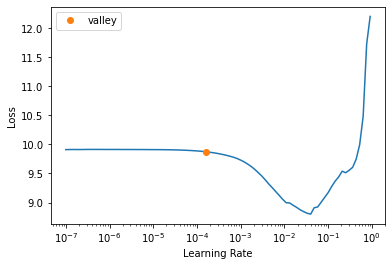

In [25]:
train_loader = torch.utils.data.DataLoader(train_data, batch_size=16, collate_fn=collate_fn, num_workers=1,
                                           pin_memory=True, shuffle=True)
test_loader = torch.utils.data.DataLoader(train_data, batch_size=16, collate_fn=collate_fn, num_workers=1,
                                           pin_memory=True, shuffle=False)
dls = fastai.DataLoaders(train_loader, test_loader)

model = EncoderLM(vocab_size, emb_size, num_layers=num_layers, nhead=8, dim_feedforward=dim_feedforward,
                  masking=True, padding_idx=padding_idx, dropout=0.1, max_len=1100, deepnorm=True).to(device)
loss_fn = Seq2SeqCrossEntropyLoss(ignore_index=padding_idx)

learn = Learner(dls, model, loss_func=loss_fn, metrics=fastai.accuracy, opt_func=fastai.RAdam)
learn.lr_find()

In [27]:
learn.fit_one_cycle(1, 0.0004)

epoch,train_loss,valid_loss,accuracy,time
0,3.923237,3.772367,0.135411,5:17:20


In [19]:
#torch.save(learn.model.state_dict(), model_path / 'checkpoint.pth')
#torch.save(vocab, model_path / 'vocab.pth')
model = EncoderLM(vocab_size, emb_size, num_layers=num_layers, nhead=8, dim_feedforward=dim_feedforward,
                  masking=True, padding_idx=padding_idx, dropout=0.2, max_len=530, deepnorm=True).to(device)
model.load_state_dict(torch.load(model_path / 'checkpoint.pth', map_location=torch.device(device)))
vocab = torch.load(model_path / 'vocab.pth')

SuggestedLRs(valley=1.2022644114040304e-05)

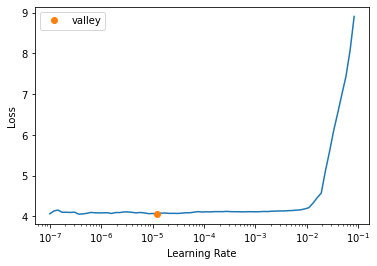

In [37]:
train_loader = torch.utils.data.DataLoader(train_data, batch_size=16, collate_fn=collate_fn, num_workers=1,
                                           pin_memory=True, shuffle=True)
test_loader = torch.utils.data.DataLoader(train_data, batch_size=16, collate_fn=collate_fn, num_workers=1,
                                           pin_memory=True, shuffle=False)
dls = fastai.DataLoaders(train_loader, test_loader)

loss_fn = Seq2SeqCrossEntropyLoss(ignore_index=padding_idx)

learn = Learner(dls, model, loss_func=loss_fn, metrics=fastai.accuracy, opt_func=fastai.RAdam)
learn.lr_find()

In [77]:
predict_seq2seq(test_data, model, model_type='lm_transformer', batch_size=8, collate_fn=collate_fn)
y.shape, yhat.shape

  0%|          | 0/317 [00:00<?, ?it/s]

(torch.Size([582470]), torch.Size([582470]))

In [78]:
def accuracy(yhat, y):
    return (y == yhat).sum().item() / len(y)

acc = accuracy(y, yhat)
acc

0.1366508146342301

In [79]:
idx = (y == 0)
acc_unk = accuracy(yhat[idx], y[idx])
acc_not_unk = accuracy(yhat[~idx], y[~idx])
acc_unk, acc_not_unk

(0.42809070958302853, 0.12964662447257383)

In [16]:
# steps_per_epoch = len(torch.utils.data.DataLoader(train_data, batch_size=16, collate_fn=collate_fn))

# model = EncoderLM(vocab_size, emb_size, num_layers=num_layers, nhead=8, dim_feedforward=dim_feedforward,
#                   masking=True, padding_idx=padding_idx, dropout=0.1, max_len=1100).to(device)
# loss_fn = nn.CrossEntropyLoss(ignore_index=padding_idx)
# # opt = get_optimizer(model, optimizer='adam', lr=0.0005, weight_decay=0)
# opt = torch.optim.RAdam(model.parameters(), lr=0.0005, weight_decay=0)
# # opt = get_optimizer(model, optimizer='sgd', lr=0.0005, weight_decay=0)
# scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=20000, gamma=0.3)
# # scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(opt, T_0=2000, T_mult=1)
# # scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.01, steps_per_epoch=steps_per_epoch, epochs=1)
# model = train_seq2seq(train_data, model, opt, loss_fn, model_type='lm_transformer', num_epochs=2, batch_size=16, 
#                       test_data=test_data, scheduler=scheduler, collate_fn=collate_fn, print_every=1,
#                       show_batches_bar=False, pin_memory=True, tensorboard=True, plot_loss=False)

  0%|          | 0/2 [00:00<?, ?it/s]

epoch: 0     train loss: 4.53151   test loss: 4.06809
epoch: 1     train loss: 4.23708   test loss: 4.0507


In [35]:
#torch.save(model.state_dict(), model_path / 'checkpoint.pth')
#torch.save(vocab, model_path / 'vocab.pth')
# model = EncoderLM(vocab_size, emb_size, num_layers=num_layers, nhead=8, dim_feedforward=dim_feedforward,
#                   masking=True, padding_idx=padding_idx, dropout=0.2, max_len=530, deepnorm=True).to(device)
# model.load_state_dict(torch.load(model_path / 'checkpoint.pth', map_location=torch.device(device)))
# vocab = torch.load(model_path / 'vocab.pth')

In [91]:
def beam_search(probs, beam_width=10, return_type=None):
    # probably a bug in this implementation, gives same result as greedy search at top one
    if not isinstance(probs, torch.Tensor):
        probs = torch.tensor(probs)
    if len(probs.shape) == 2:
        probs = probs[None, :]
        
    batch_size, seq_len, _ = probs.shape
    log_probs = probs.log()
    log_prob, indices = log_probs[:, 0, :].topk(beam_width, sorted=True)
    indices = indices.unsqueeze(-1)
    for i in range(1, seq_len):
        log_prob = log_prob.unsqueeze(-1) + log_probs[:, i, :].unsqueeze(1).repeat(1, beam_width, 1)
        log_prob, idx = log_prob.reshape(batch_size, -1).topk(beam_width, sorted=True)
        indices = torch.cat([indices, idx.unsqueeze(-1)], dim=-1)
    
    indices = indices.long().cpu()
    scores = -log_prob.float().cpu()
    if return_type == 'list':
        indices = indices.detach().cpu().numpy().tolist()
        scores = scores.detach().cpu().numpy().tolist()
    return indices, scores

def generate_text(seed, model, vocab, tokenizer, max_len=20, temperature=0.5):
    stoi, itos = vocab.get_stoi(), vocab.get_itos()
    model = model.eval()
    seed = ['<bos>'] + tokenizer(seed)
    x = torch.tensor([stoi[word] for word in seed]).long().to(device)[None, :]
    idxs = []
    probs = []
    idx_prev = stoi['<unk>']
    for _ in range(max_len):
        yhat = model(x)
        prob = yhat[:, -1].softmax(dim=-1)
        if torch.rand(1) < temperature or idx_prev == stoi['<unk>']:
            idx = torch.multinomial(prob, 1, replacement=True).item()
        else:
            idx = prob.argmax(-1).item()
        idxs.append(idx)
        probs.append(prob.unsqueeze(dim=1))
        x = torch.cat([x, torch.ones(1, 1).fill_(idx).long().to(device)], dim=1)
        idx_prev = idx
        if itos[idx] == '<eos>':
            break
    probs = torch.cat(probs, dim=1)
    generated = [itos[idx] for idx in idxs]
    return ' '.join(generated)

seed = 'This is a story about'
seed + ' ' + generate_text(seed, model, vocab, tokenizer, max_len=100, temperature=0.7)

'This is a story about how actor <unk> wants to keep his life outside of the body . he is voiced by jim and said to have been cast and <unk> by his family in the film . <eos>'

In [80]:
def swa(train_data, model, optimizer, num_iters=1000, swa_lr=0.0001, batch_size=32, collate_fn=collate_fn):
    train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, collate_fn=collate_fn)
    swa_model = torch.optim.swa_utils.AveragedModel(model).to(device)
    swa_scheduler = torch.optim.swa_utils.SWALR(optimizer, swa_lr=swa_lr)
    for i in tqdm(range(num_iters)):
        swa_model.update_parameters(model)
        swa_scheduler.step()
    torch.optim.swa_utils.update_bn(train_loader, swa_model)
    return swa_model

opt = torch.optim.RAdam(model.parameters(), lr=1e-5, weight_decay=0)
swa_model = swa(train_data, model, opt, swa_lr=1e-5, num_iters=5_000, batch_size=16)

  0%|          | 0/5000 [00:00<?, ?it/s]

/opt/conda/envs/main/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:131: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


In [89]:
y, yhat = predict_seq2seq(test_data, swa_model, model_type='lm_transformer', batch_size=8, collate_fn=collate_fn)
acc = accuracy(y, yhat)
acc

  0%|          | 0/317 [00:00<?, ?it/s]

0.15929391322451367

In [92]:
seed = 'This is a story about'
seed + ' ' + generate_text(seed, swa_model, vocab, tokenizer, max_len=100, temperature=0.5)

'This is a story about crying and eating birds , taking himself to the <unk> of the <unk> . the <unk> kills the <unk> when his wife and his wife continue to die and , and the <unk> <unk> discovers that they are traveling to the <unk> castle . the <unk> discovers that he is present in battle , but these are detained by the <unk> and claudius . <unk> announces that they have been killed by the <unk> , who arrives at the centers of <unk> and dies . suffering from arrest , <unk> protests the <unk> granted him the <unk> . <unk> tells'

### Cache for later

In [82]:
# estimated opportunity cost rate
salary = 155_000
hours_per_year = 52 * 40
hourly_rate = salary / hours_per_year
hourly_rate

74.51923076923077

In [83]:
# estimated mentorship time
hours_per_week = 4
mentorship_length_months = 5 # 6 months
mentorship_length_weeks = mentorship_length_months * 52 / 12
total_hours = mentorship_length_weeks * hours_per_week
total_hours

86.66666666666667

In [84]:
opportunity_cost = hourly_rate * total_hours
opportunity_cost

6458.333333333334

In [88]:
projected_mentee_salary = 120_000
my_rate = 0.05 # standard 5% cut for 12 months
my_cut = projected_mentee_salary * my_rate
my_cut

6000.0

In [25]:
sum([p.numel() for p in model.parameters()])

31013920

In [51]:
torch.cuda.empty_cache()
del model

In [118]:
sum(['Feynman' in doc for doc in tqdm(train_text)])

  0%|          | 0/1805110 [00:00<?, ?it/s]

65